In [ ]:
!pip install kaggle

In [ ]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [ ]:
import kaggle

In [ ]:
!kaggle datasets download -d atulanandjha/lfwpeople

 93% 216M/232M [00:01<00:00, 218MB/s]
100% 232M/232M [00:01<00:00, 179MB/s]


In [ ]:
!unzip lfwpeople.zip

Archive:  lfwpeople.zip
  inflating: lfw-funneled.tgz        
  inflating: pairs.txt               
  inflating: pairsDevTest.txt        
  inflating: pairsDevTrain.txt       


In [ ]:
!tar -xf lfw-funneled.tgz

In [ ]:
!pip install tensorflow

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
plt.style.use("seaborn-v0_8-colorblind") #The style of plotting
import math
import tensorflow as tf
from tensorflow.keras import (layers,models,optimizers,utils,callbacks,metrics,losses,activations)

# Preprocessing of DATA

In [ ]:
#retreive elements from the datasets
def sample_batch(dataset):
    batch = dataset.take(1).get_single_element()
    if isinstance(batch, tuple):
        batch = batch[0]
    return batch.numpy()


def display(images, n=10, size=(20, 3), cmap="gray_r", as_type="float32", save_to=None):
    """
    Displays n random images from each one of the supplied arrays.
    """
    if images.max() > 1.0:
        images = images / 255.0
    elif images.min() < 0.0:
        images = (images + 1.0) / 2.0

    plt.figure(figsize=size)
    for i in range(n):
        _ = plt.subplot(1, n, i + 1)
        plt.imshow(images[i].astype(as_type), cmap=cmap)
        plt.axis("off")

    if save_to:
        plt.savefig(save_to)
        print(f"\nSaved to {save_to}")

    plt.show()

In [ ]:
#Parameters
IMAGE_SIZE = 64
BATCH_SIZE = 64
DATASET_REPETITIONS = 5
LOAD_MODEL = False

NOISE_EMBEDDING_SIZE = 32
PLOT_DIFFUSION_STEPS = 20

# optimization
EMA = 0.999
LEARNING_RATE = 1e-3
WEIGHT_DECAY = 1e-4
EPOCHS = 50

In [ ]:
# Load the data
train_data = utils.image_dataset_from_directory(
    "/content/lfw_funneled",
    labels=None,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=None,
    shuffle=True,
    seed=42,
    interpolation="bilinear", #this is a method that uses the average pixels in resizing the images for maitaining the quality of the image
)

Found 13233 files belonging to 1 classes.


In [ ]:
train_data

<_ShuffleDataset element_spec=TensorSpec(shape=(64, 64, 3), dtype=tf.float32, name=None)>

In [ ]:
# Preprocess the data
def preprocess(img):
    img = tf.cast(img, "float32") / 255.0
    return img

# train_data is an TF object so we can use these function such as repeat and batch
train = train_data.map(lambda x: preprocess(x)) # Apply preprocess to all the data in train data
train = train.repeat(DATASET_REPETITIONS) # Augment the number of data by cloning the images
train = train.batch(BATCH_SIZE, drop_remainder=True) # Make batches and drop the last one when finding that it cannot acheive the number of BATCH_SIZE

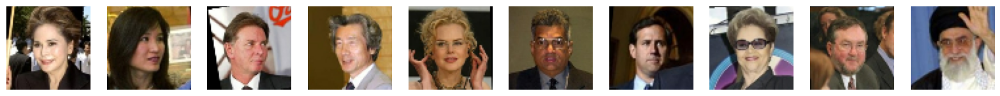

In [ ]:
# Show some items of clothing from the training set
train_sample = sample_batch(train)
display(train_sample,n=10)

# Noising images

In [ ]:
# Linear Diffusion schedule
# Signal rates represent the diffusion of the essential structure in the image
# Noise rates represents the amount of noise diffusion
def linear_diffusion_schedule(diffusion_times):
    min_rate = 0.0001
    max_rate = 0.02
    betas = min_rate + diffusion_times * (max_rate - min_rate)
    alphas = 1 - betas
    alpha_bars = tf.math.cumprod(alphas)
    signal_rates = tf.sqrt(alpha_bars)
    noise_rates = tf.sqrt(1 - alpha_bars)
    return noise_rates, signal_rates

In [ ]:
def cosine_diffusion_schedule(diffusion_times):
    signal_rates = tf.cos(diffusion_times * math.pi / 2)
    noise_rates = tf.sin(diffusion_times * math.pi / 2)
    return noise_rates, signal_rates

In [ ]:
def offset_cosine_diffusion_schedule(diffusion_times):
    min_signal_rate = 0.02
    max_signal_rate = 0.95
    start_angle = tf.acos(max_signal_rate)
    end_angle = tf.acos(min_signal_rate)

    diffusion_angles = start_angle + diffusion_times * (end_angle - start_angle)

    signal_rates = tf.cos(diffusion_angles)
    noise_rates = tf.sin(diffusion_angles)

    return noise_rates, signal_rates

In [ ]:
T = 1000
diffusion_times = tf.convert_to_tensor([x / T for x in range(T)])
linear_noise_rates, linear_signal_rates = linear_diffusion_schedule(diffusion_times)
cosine_noise_rates, cosine_signal_rates = cosine_diffusion_schedule(diffusion_times)
(offset_cosine_noise_rates,offset_cosine_signal_rates,) = offset_cosine_diffusion_schedule(diffusion_times)

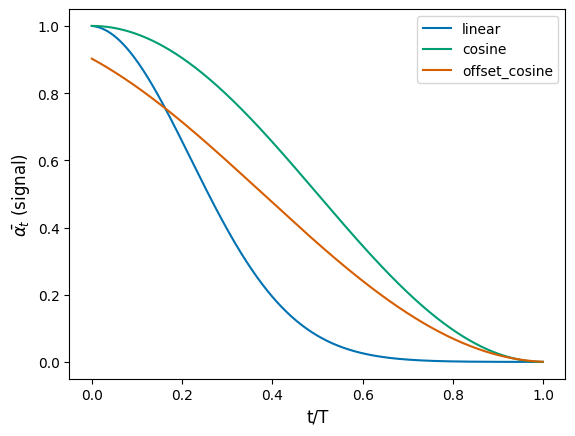

In [ ]:
plt.plot(diffusion_times, linear_signal_rates**2, linewidth=1.5, label="linear")
plt.plot(diffusion_times, cosine_signal_rates**2, linewidth=1.5, label="cosine")
plt.plot(diffusion_times,offset_cosine_signal_rates**2,linewidth=1.5,label="offset_cosine")

plt.xlabel("t/T", fontsize=12)
plt.ylabel(r"$\bar{\alpha_t}$ (signal)", fontsize=12)
plt.legend()
plt.show()

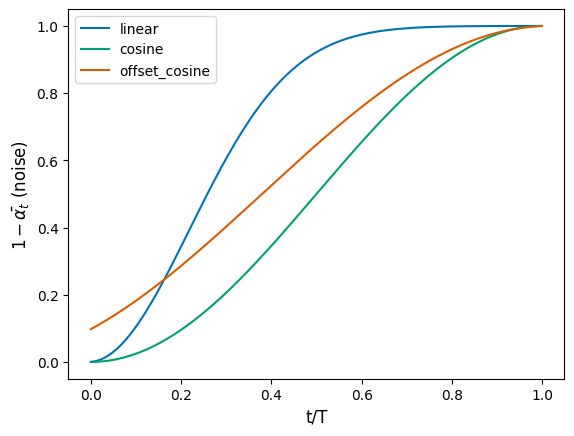

In [ ]:
plt.plot(
    diffusion_times, linear_noise_rates**2, linewidth=1.5, label="linear"
)
plt.plot(
    diffusion_times, cosine_noise_rates**2, linewidth=1.5, label="cosine"
)
plt.plot(
    diffusion_times,
    offset_cosine_noise_rates**2,
    linewidth=1.5,
    label="offset_cosine",
)

plt.xlabel("t/T", fontsize=12)
plt.ylabel(r"$1-\bar{\alpha_t}$ (noise)", fontsize=12)
plt.legend()
plt.show()

In [ ]:
def sinusoidal_embedding(x):
    frequencies = tf.exp(
        tf.linspace(
            tf.math.log(1.0),
            tf.math.log(1000.0),
            NOISE_EMBEDDING_SIZE // 2,
        )
    )
    angular_speeds = 2.0 * math.pi * frequencies
    embeddings = tf.concat(
        [tf.sin(angular_speeds * x), tf.cos(angular_speeds * x)], axis=3
    )
    return embeddings

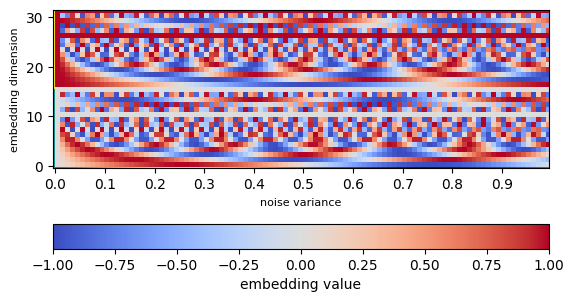

In [ ]:
embedding_list = []
for y in np.arange(0, 1, 0.01):
    embedding_list.append(sinusoidal_embedding(np.array([[[[y]]]]))[0][0][0])
embedding_array = np.array(np.transpose(embedding_list))
fig, ax = plt.subplots()
ax.set_xticks(
    np.arange(0, 100, 10), labels=np.round(np.arange(0.0, 1.0, 0.1), 1)
)
ax.set_ylabel("embedding dimension", fontsize=8)
ax.set_xlabel("noise variance", fontsize=8)
plt.pcolor(embedding_array, cmap="coolwarm")
plt.colorbar(orientation="horizontal", label="embedding value")
ax.imshow(embedding_array, interpolation="nearest", origin="lower")
plt.show()

In [ ]:
def ResidualBlock(width):
    def apply(x):
        input_width = x.shape[3]
        if input_width == width:
            residual = x
        else:
            residual = layers.Conv2D(width, kernel_size=1)(x)
        x = layers.BatchNormalization(center=False, scale=False)(x)
        x = layers.Conv2D(width, kernel_size=3, padding="same", activation=activations.swish)(x)
        x = layers.Conv2D(width, kernel_size=3, padding="same")(x)
        x = layers.Add()([x, residual])
        return x

    return apply


def DownBlock(width, block_depth):
    def apply(x):
        x, skips = x
        for _ in range(block_depth):
            x = ResidualBlock(width)(x)
            skips.append(x)
        x = layers.AveragePooling2D(pool_size=2)(x)
        return x

    return apply


def UpBlock(width, block_depth):
    def apply(x):
        x, skips = x
        x = layers.UpSampling2D(size=2, interpolation="bilinear")(x)
        for _ in range(block_depth):
            x = layers.Concatenate()([x, skips.pop()])
            x = ResidualBlock(width)(x)
        return x

    return apply

In [ ]:
# Build the U-Net

noisy_images = layers.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
x = layers.Conv2D(32, kernel_size=1)(noisy_images)

noise_variances = layers.Input(shape=(1, 1, 1))
noise_embedding = layers.Lambda(sinusoidal_embedding)(noise_variances)
noise_embedding = layers.UpSampling2D(size=IMAGE_SIZE, interpolation="nearest")(noise_embedding)

x = layers.Concatenate()([x, noise_embedding])

skips = []

x = DownBlock(32, block_depth=2)([x, skips])
x = DownBlock(64, block_depth=2)([x, skips])
x = DownBlock(96, block_depth=2)([x, skips])

x = ResidualBlock(128)(x)
x = ResidualBlock(128)(x)

x = UpBlock(96, block_depth=2)([x, skips])
x = UpBlock(64, block_depth=2)([x, skips])
x = UpBlock(32, block_depth=2)([x, skips])

x = layers.Conv2D(3, kernel_size=1, kernel_initializer="zeros")(x)

unet = models.Model([noisy_images, noise_variances], x, name="unet")

In [ ]:
class DiffusionModel(models.Model):
    def __init__(self):
        super().__init__()

        self.normalizer = layers.Normalization()
        self.network = unet
        self.ema_network = models.clone_model(self.network)
        self.diffusion_schedule = offset_cosine_diffusion_schedule

    def compile(self, **kwargs):
        super().compile(**kwargs)
        self.noise_loss_tracker = metrics.Mean(name="n_loss")

    @property
    def metrics(self):
        return [self.noise_loss_tracker]

    def denormalize(self, images):
        images = self.normalizer.mean + images * self.normalizer.variance**0.5
        return tf.clip_by_value(images, 0.0, 1.0)

    def denoise(self, noisy_images, noise_rates, signal_rates, training):
        if training:
            network = self.network
        else:
            network = self.ema_network

        pred_noises = network([noisy_images, noise_rates**2], training=training)
        pred_images = (noisy_images - noise_rates * pred_noises) / signal_rates
        return pred_noises, pred_images

    def reverse_diffusion(self, initial_noise, diffusion_steps):
        num_images = initial_noise.shape[0]
        step_size = 1.0 / diffusion_steps
        current_images = initial_noise
        for step in range(diffusion_steps):
            diffusion_times = tf.ones((num_images, 1, 1, 1)) - step * step_size
            noise_rates, signal_rates = self.diffusion_schedule(diffusion_times)
            pred_noises, pred_images = self.denoise(current_images, noise_rates, signal_rates, training=False)
            next_diffusion_times = diffusion_times - step_size
            next_noise_rates, next_signal_rates = self.diffusion_schedule(next_diffusion_times)
            current_images = (next_signal_rates * pred_images + next_noise_rates * pred_noises)
        return pred_images

    def generate(self, num_images, diffusion_steps, initial_noise=None):
        if initial_noise is None:
            initial_noise = tf.random.normal(shape=(num_images, IMAGE_SIZE, IMAGE_SIZE, 3))
        generated_images = self.reverse_diffusion(initial_noise, diffusion_steps)
        generated_images = self.denormalize(generated_images)
        return generated_images

    def train_step(self, images):
        images = self.normalizer(images, training=True)
        noises = tf.random.normal(shape=(BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, 3))

        diffusion_times = tf.random.uniform(
            shape=(BATCH_SIZE, 1, 1, 1), minval=0.0, maxval=1.0
        )
        noise_rates, signal_rates = self.diffusion_schedule(diffusion_times)

        noisy_images = signal_rates * images + noise_rates * noises

        with tf.GradientTape() as tape:
            # train the network to separate noisy images to their components
            pred_noises, pred_images = self.denoise(
                noisy_images, noise_rates, signal_rates, training=True
            )

            noise_loss = self.loss(noises, pred_noises)  # used for training

        gradients = tape.gradient(noise_loss, self.network.trainable_weights)
        self.optimizer.apply_gradients(zip(gradients, self.network.trainable_weights))

        self.noise_loss_tracker.update_state(noise_loss)

        for weight, ema_weight in zip(self.network.weights, self.ema_network.weights):
            ema_weight.assign(EMA * ema_weight + (1 - EMA) * weight)
        return {m.name: m.result() for m in self.metrics}

    def test_step(self, images):
        images = self.normalizer(images, training=False)
        noises = tf.random.normal(shape=(BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, 3))
        diffusion_times = tf.random.uniform(
            shape=(BATCH_SIZE, 1, 1, 1), minval=0.0, maxval=1.0
        )
        noise_rates, signal_rates = self.diffusion_schedule(diffusion_times)
        noisy_images = signal_rates * images + noise_rates * noises
        pred_noises, pred_images = self.denoise(
            noisy_images, noise_rates, signal_rates, training=False
        )
        noise_loss = self.loss(noises, pred_noises)
        self.noise_loss_tracker.update_state(noise_loss)

        return {m.name: m.result() for m in self.metrics}

In [ ]:
ddm = DiffusionModel()
ddm.normalizer.adapt(train)

In [ ]:
ddm.compile(
    optimizer=optimizers.experimental.AdamW(
        learning_rate=LEARNING_RATE, weight_decay=WEIGHT_DECAY
    ),
    loss=losses.mean_absolute_error,
)

Epoch 1/200
   6/1033 [..............................] - ETA: 3:03 - n_loss: 0.7768

1033/1033 [==============================] - ETA: 0s - n_loss: 0.1763
Saved to ./generated_img_000.png


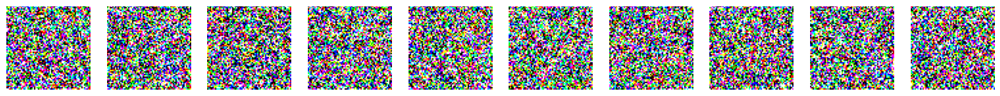

1033/1033 [==============================] - 222s 186ms/step - n_loss: 0.1763
Epoch 2/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1421
Saved to ./generated_img_001.png


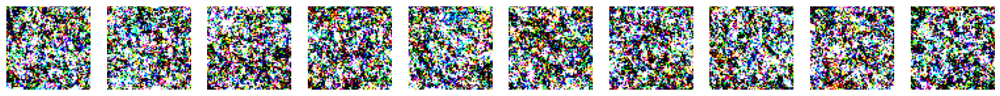

1033/1033 [==============================] - 197s 190ms/step - n_loss: 0.1421
Epoch 3/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1364
Saved to ./generated_img_002.png


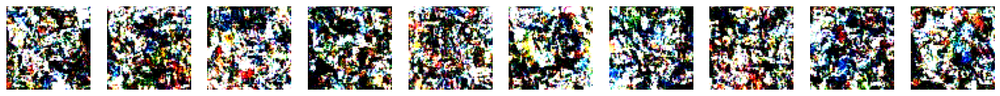

1033/1033 [==============================] - 198s 191ms/step - n_loss: 0.1364
Epoch 4/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1339
Saved to ./generated_img_003.png


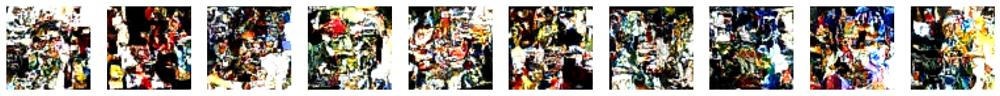

1033/1033 [==============================] - 198s 191ms/step - n_loss: 0.1339
Epoch 5/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1319
Saved to ./generated_img_004.png


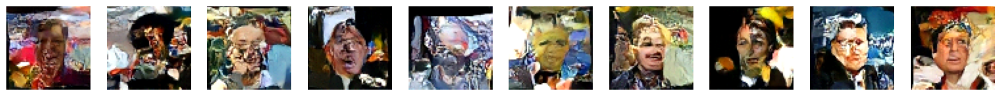

1033/1033 [==============================] - 199s 192ms/step - n_loss: 0.1319
Epoch 6/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1306
Saved to ./generated_img_005.png


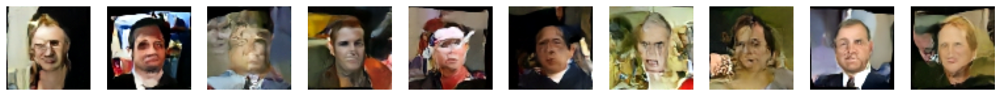

1033/1033 [==============================] - 198s 191ms/step - n_loss: 0.1306
Epoch 7/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1301
Saved to ./generated_img_006.png


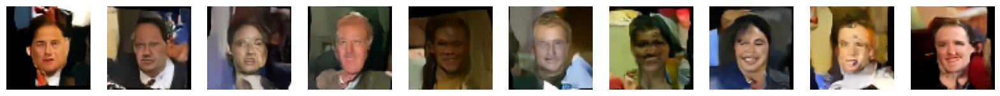

1033/1033 [==============================] - 198s 191ms/step - n_loss: 0.1301
Epoch 8/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1288
Saved to ./generated_img_007.png


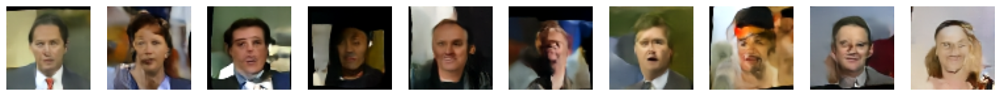

1033/1033 [==============================] - 198s 191ms/step - n_loss: 0.1288
Epoch 9/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1282
Saved to ./generated_img_008.png


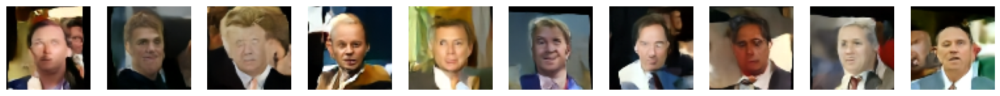

1033/1033 [==============================] - 199s 192ms/step - n_loss: 0.1282
Epoch 10/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1278
Saved to ./generated_img_009.png


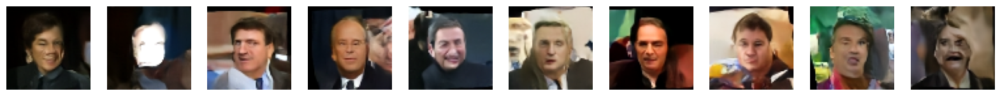

1033/1033 [==============================] - 199s 192ms/step - n_loss: 0.1278
Epoch 11/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1274
Saved to ./generated_img_010.png


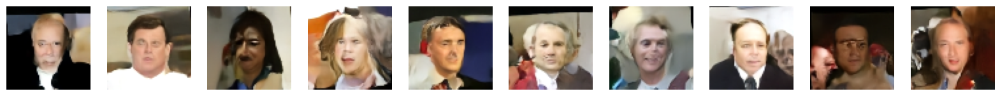

1033/1033 [==============================] - 198s 192ms/step - n_loss: 0.1274
Epoch 12/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1268
Saved to ./generated_img_011.png


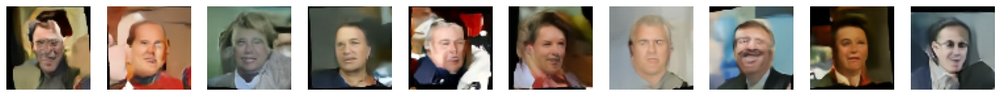

1033/1033 [==============================] - 198s 191ms/step - n_loss: 0.1268
Epoch 13/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1267
Saved to ./generated_img_012.png


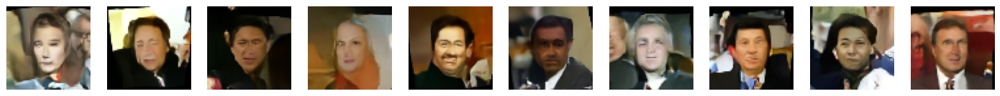

1033/1033 [==============================] - 198s 192ms/step - n_loss: 0.1267
Epoch 14/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1267
Saved to ./generated_img_013.png


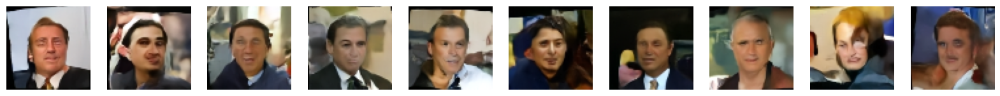

1033/1033 [==============================] - 200s 193ms/step - n_loss: 0.1267
Epoch 15/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1257
Saved to ./generated_img_014.png


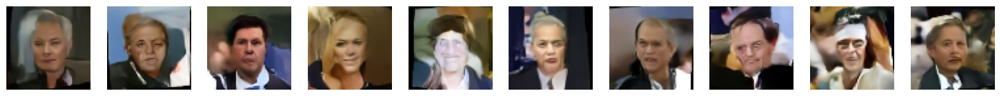

1033/1033 [==============================] - 199s 192ms/step - n_loss: 0.1257
Epoch 16/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1259
Saved to ./generated_img_015.png


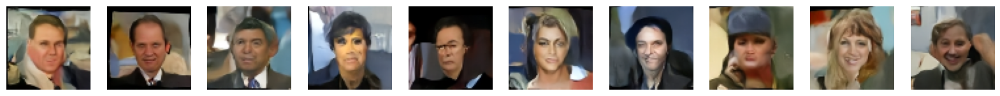

1033/1033 [==============================] - 199s 192ms/step - n_loss: 0.1259
Epoch 17/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1252
Saved to ./generated_img_016.png


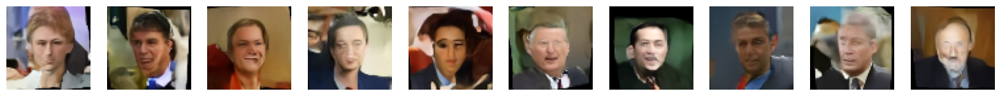

1033/1033 [==============================] - 199s 192ms/step - n_loss: 0.1252
Epoch 18/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1251
Saved to ./generated_img_017.png


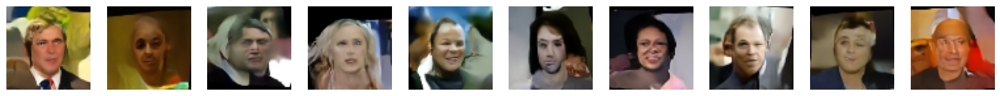

1033/1033 [==============================] - 200s 193ms/step - n_loss: 0.1251
Epoch 19/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1251
Saved to ./generated_img_018.png


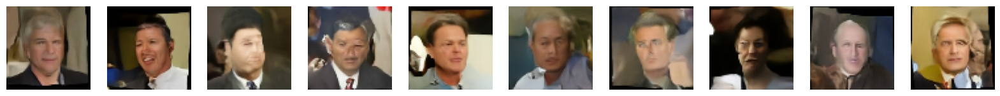

1033/1033 [==============================] - 200s 193ms/step - n_loss: 0.1251
Epoch 20/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1245
Saved to ./generated_img_019.png


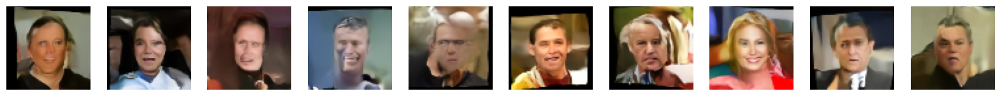

1033/1033 [==============================] - 200s 193ms/step - n_loss: 0.1245
Epoch 21/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1251
Saved to ./generated_img_020.png


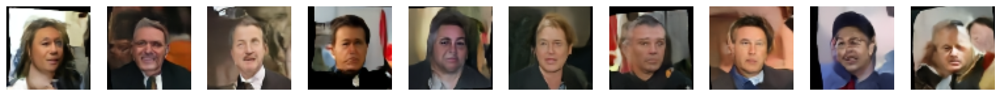

1033/1033 [==============================] - 200s 193ms/step - n_loss: 0.1251
Epoch 22/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1244
Saved to ./generated_img_021.png


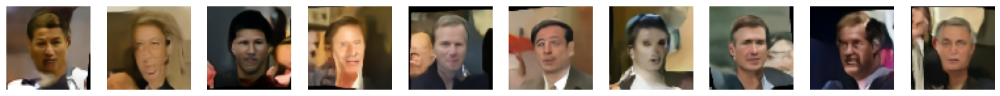

1033/1033 [==============================] - 200s 193ms/step - n_loss: 0.1244
Epoch 23/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1241
Saved to ./generated_img_022.png


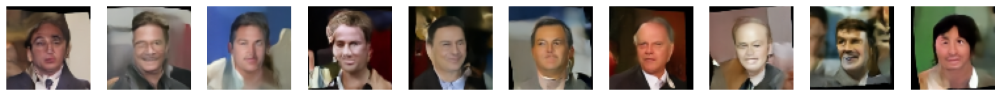

1033/1033 [==============================] - 199s 192ms/step - n_loss: 0.1241
Epoch 24/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1242
Saved to ./generated_img_023.png


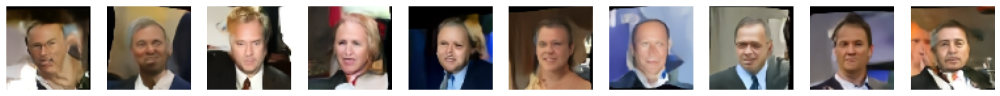

1033/1033 [==============================] - 200s 193ms/step - n_loss: 0.1242
Epoch 25/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1239
Saved to ./generated_img_024.png


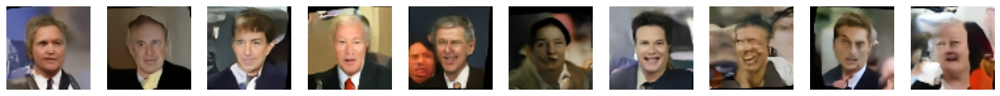

1033/1033 [==============================] - 200s 193ms/step - n_loss: 0.1239
Epoch 26/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1238
Saved to ./generated_img_025.png


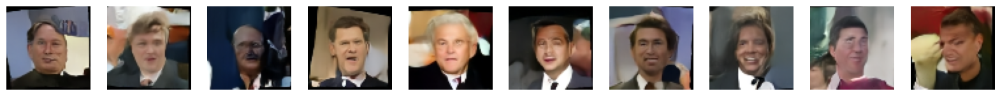

1033/1033 [==============================] - 200s 193ms/step - n_loss: 0.1238
Epoch 27/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1233
Saved to ./generated_img_026.png


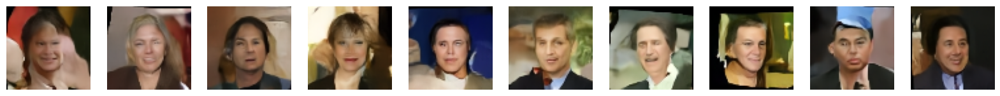

1033/1033 [==============================] - 201s 194ms/step - n_loss: 0.1233
Epoch 28/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1236
Saved to ./generated_img_027.png


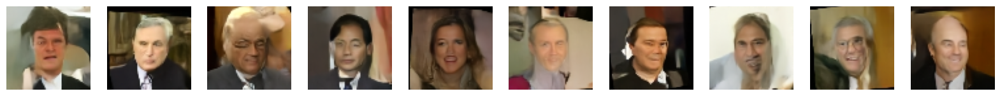

1033/1033 [==============================] - 200s 193ms/step - n_loss: 0.1236
Epoch 29/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1234
Saved to ./generated_img_028.png


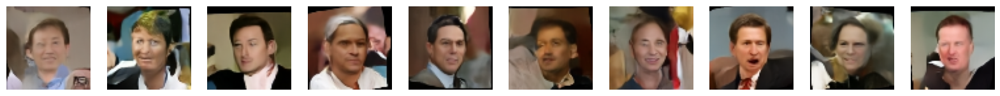

1033/1033 [==============================] - 201s 194ms/step - n_loss: 0.1234
Epoch 30/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1232
Saved to ./generated_img_029.png


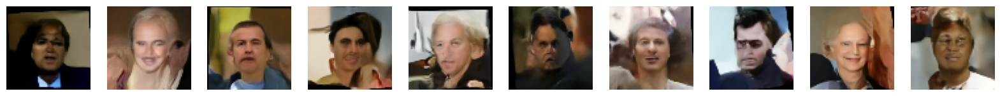

1033/1033 [==============================] - 201s 194ms/step - n_loss: 0.1232
Epoch 31/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1232
Saved to ./generated_img_030.png


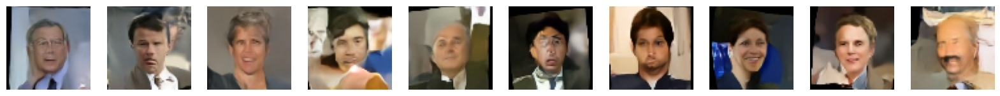

1033/1033 [==============================] - 201s 194ms/step - n_loss: 0.1232
Epoch 32/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1233
Saved to ./generated_img_031.png


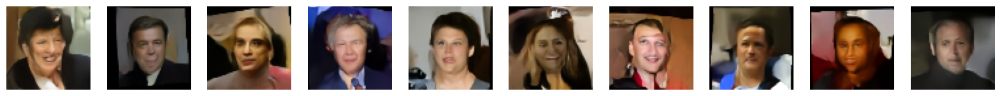

1033/1033 [==============================] - 201s 193ms/step - n_loss: 0.1233
Epoch 33/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1233
Saved to ./generated_img_032.png


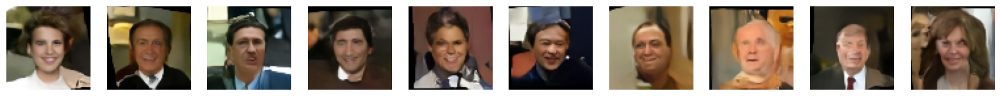

1033/1033 [==============================] - 201s 194ms/step - n_loss: 0.1233
Epoch 34/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1228
Saved to ./generated_img_033.png


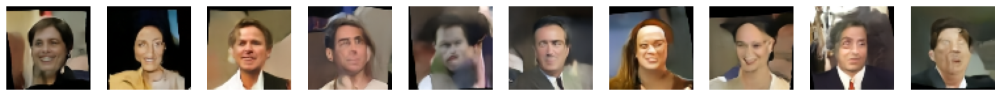

1033/1033 [==============================] - 203s 196ms/step - n_loss: 0.1228
Epoch 35/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1231
Saved to ./generated_img_034.png


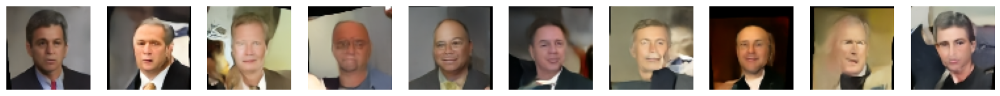

1033/1033 [==============================] - 203s 195ms/step - n_loss: 0.1231
Epoch 36/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1233
Saved to ./generated_img_035.png


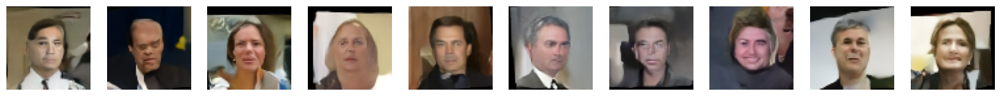

1033/1033 [==============================] - 203s 196ms/step - n_loss: 0.1233
Epoch 37/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1227
Saved to ./generated_img_036.png


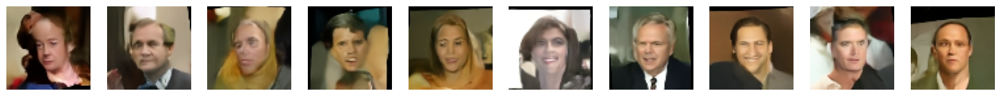

1033/1033 [==============================] - 202s 195ms/step - n_loss: 0.1227
Epoch 38/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1230
Saved to ./generated_img_037.png


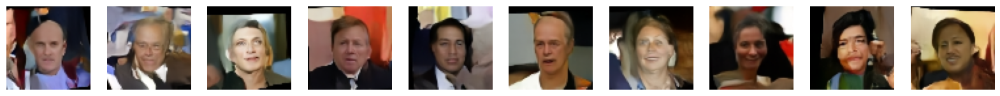

1033/1033 [==============================] - 203s 196ms/step - n_loss: 0.1230
Epoch 39/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1224
Saved to ./generated_img_038.png


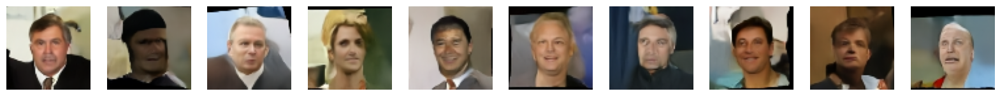

1033/1033 [==============================] - 204s 197ms/step - n_loss: 0.1224
Epoch 40/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1227
Saved to ./generated_img_039.png


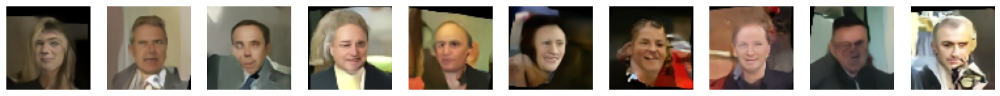

1033/1033 [==============================] - 205s 197ms/step - n_loss: 0.1227
Epoch 41/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1220
Saved to ./generated_img_040.png


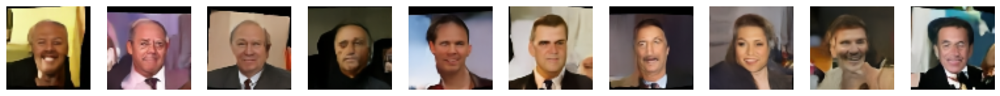

1033/1033 [==============================] - 204s 197ms/step - n_loss: 0.1220
Epoch 42/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1223
Saved to ./generated_img_041.png


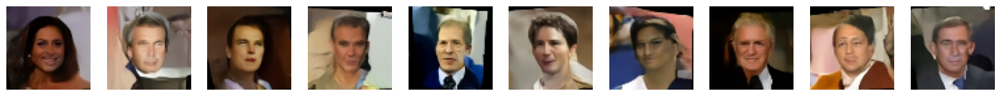

1033/1033 [==============================] - 204s 197ms/step - n_loss: 0.1223
Epoch 43/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1222
Saved to ./generated_img_042.png


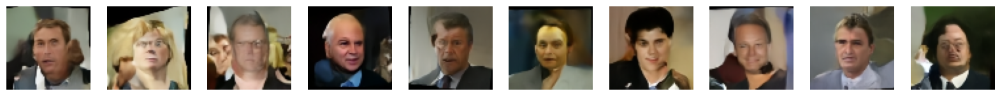

1033/1033 [==============================] - 204s 196ms/step - n_loss: 0.1222
Epoch 44/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1226
Saved to ./generated_img_043.png


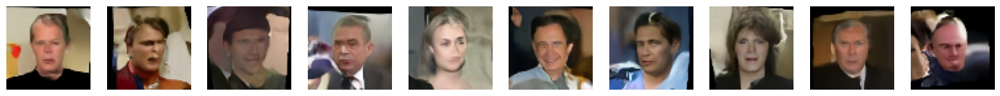

1033/1033 [==============================] - 204s 197ms/step - n_loss: 0.1226
Epoch 45/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1222
Saved to ./generated_img_044.png


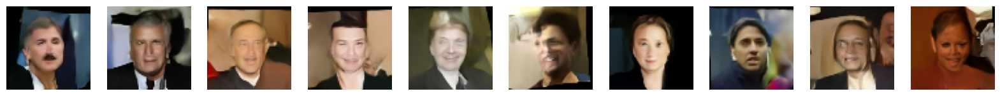

1033/1033 [==============================] - 203s 196ms/step - n_loss: 0.1222
Epoch 46/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1221
Saved to ./generated_img_045.png


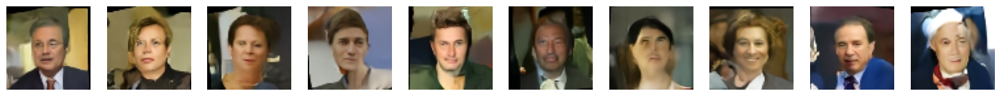

1033/1033 [==============================] - 204s 197ms/step - n_loss: 0.1221
Epoch 47/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1224
Saved to ./generated_img_046.png


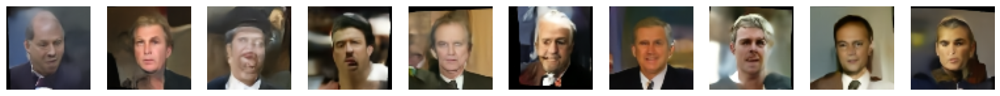

1033/1033 [==============================] - 204s 196ms/step - n_loss: 0.1224
Epoch 48/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1222
Saved to ./generated_img_047.png


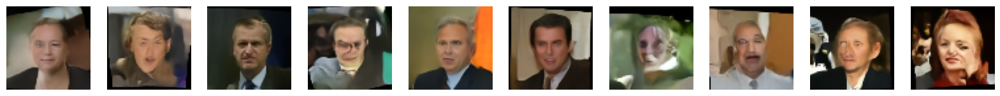

1033/1033 [==============================] - 204s 196ms/step - n_loss: 0.1222
Epoch 49/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1223
Saved to ./generated_img_048.png


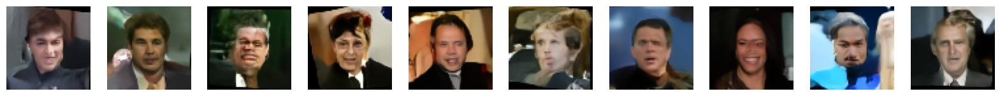

1033/1033 [==============================] - 204s 196ms/step - n_loss: 0.1223
Epoch 50/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1219
Saved to ./generated_img_049.png


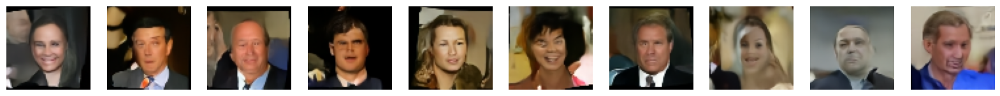

1033/1033 [==============================] - 204s 197ms/step - n_loss: 0.1219
Epoch 51/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1222
Saved to ./generated_img_050.png


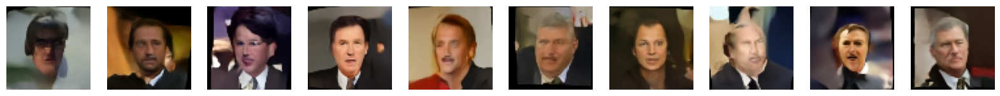

1033/1033 [==============================] - 204s 197ms/step - n_loss: 0.1222
Epoch 52/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1222
Saved to ./generated_img_051.png


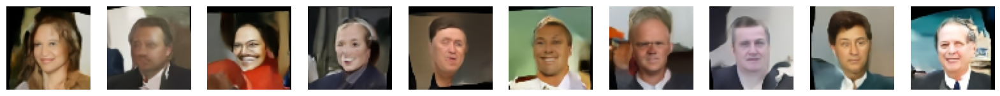

1033/1033 [==============================] - 204s 196ms/step - n_loss: 0.1222
Epoch 53/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1220
Saved to ./generated_img_052.png


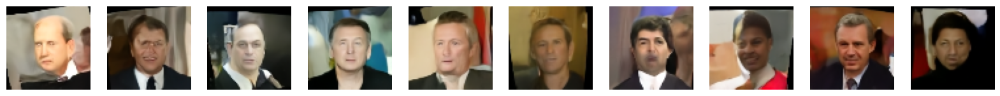

1033/1033 [==============================] - 204s 196ms/step - n_loss: 0.1220
Epoch 54/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1217
Saved to ./generated_img_053.png


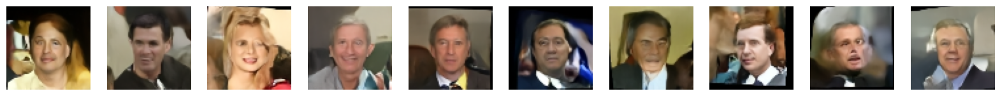

1033/1033 [==============================] - 204s 197ms/step - n_loss: 0.1217
Epoch 55/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1219
Saved to ./generated_img_054.png


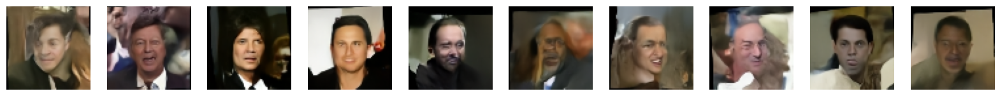

1033/1033 [==============================] - 204s 197ms/step - n_loss: 0.1219
Epoch 56/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1217
Saved to ./generated_img_055.png


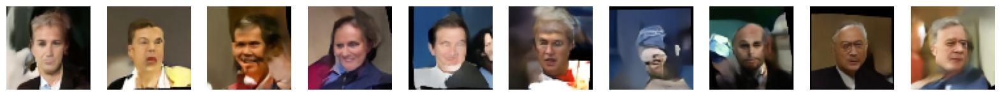

1033/1033 [==============================] - 203s 196ms/step - n_loss: 0.1217
Epoch 57/200
1033/1033 [==============================] - ETA: 0s - n_loss: 0.1215
Saved to ./generated_img_056.png


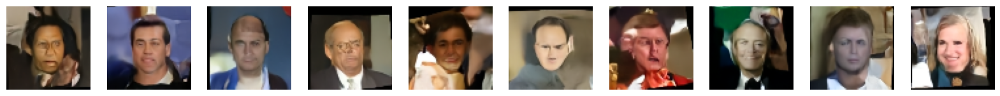

1033/1033 [==============================] - 204s 197ms/step - n_loss: 0.1215
Epoch 58/200
1028/1033 [============================>.] - ETA: 0s - n_loss: 0.1215

In [ ]:
# run training and plot generated images periodically
model_checkpoint_callback = callbacks.ModelCheckpoint(
    filepath="./checkpoint.ckpt",
    save_weights_only=True,
    save_freq="epoch",
    verbose=0,
)

tensorboard_callback = callbacks.TensorBoard(log_dir="./logs")


class ImageGenerator(callbacks.Callback):
    def __init__(self, num_img):
        self.num_img = num_img

    def on_epoch_end(self, epoch, logs=None):
        generated_images = self.model.generate(num_images=self.num_img,diffusion_steps=PLOT_DIFFUSION_STEPS).numpy()
        display(generated_images,save_to="./generated_img_%03d.png" % (epoch))


image_generator_callback = ImageGenerator(num_img=10)

ddm.fit(
    train,
    epochs=EPOCHS,
    callbacks=[
        model_checkpoint_callback,
        tensorboard_callback,
        image_generator_callback,
    ],
)

In [ ]:
# Generate some novel images of flowers
generated_images = ddm.generate(num_images=10, diffusion_steps=20).numpy()
display(generated_images)

In [ ]:
# View improvement over greater number of diffusion steps
for diffusion_steps in list(np.arange(1, 6, 1)) + [20] + [100]:
    tf.random.set_seed(42)
    generated_images = ddm.generate(num_images=10,diffusion_steps=diffusion_steps,).numpy()
    display(generated_images)

In [ ]:
# Interpolation between two points in the latent space
tf.random.set_seed(100)


def spherical_interpolation(a, b, t):
    return np.sin(t * math.pi / 2) * a + np.cos(t * math.pi / 2) * b


for i in range(5):
    a = tf.random.normal(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
    b = tf.random.normal(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
    initial_noise = np.array([spherical_interpolation(a, b, t) for t in np.arange(0, 1.1, 0.1)])
    generated_images = ddm.generate(num_images=2, diffusion_steps=20, initial_noise=initial_noise).numpy()
    display(generated_images, n=11)